<a href="https://colab.research.google.com/github/ananya1653/Adversarial-attack/blob/main/adversarial_attack_(research)_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

FGSM PREDICTION


In [ ]:
import numpy as np
import keras
import tensorflow as tf
from keras.datasets import mnist
from keras.models import Model
from keras.layers import Dense, Input
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten,Conv2DTranspose,Concatenate
from keras import backend as k
import os

from google.colab import drive
drive.mount("/content/drive")

image_folder = '/content/drive/MyDrive/drive/drive/train/1st_manual'
manual_folder = '/content/drive/MyDrive/drive/drive/train/images'
mask_folder = '/content/drive/MyDrive/drive/drive/train/mask' # Uncomment this line to include the mask folder

# Import the load_img and img_to_array functions
from keras.preprocessing.image import load_img, img_to_array

def load_and_preprocess_images(image_folder, size=(256, 256)):
    image_list = []
    filenames = sorted(os.listdir(image_folder))  # Sort to ensure matching filenames between images and labels
    for filename in filenames:
        img_path = os.path.join(image_folder, filename)
        img = load_img(img_path, target_size=size)
        img_array = img_to_array(img) / 255.0  # Normalize images to [0, 1]
        image_list.append(img_array)
    return np.array(image_list), filenames

images, image_filenames = load_and_preprocess_images(image_folder)
manuals, manual_filenames = load_and_preprocess_images(manual_folder)
masks, mask_filenames = load_and_preprocess_images(mask_folder) # Uncomment this line to load and preprocess masks

# Instead of asserting equality, print the filenames to inspect them
print(f"Image filenames: {image_filenames}")
print(f"Manual filenames: {manual_filenames}")
print(f"Mask filenames: {mask_filenames}")

# You need to define train_test_split or import it from sklearn.model_selection
from sklearn.model_selection import train_test_split

# Check if the number of samples in 'images' and 'manuals' match
if images.shape[0] != manuals.shape[0]:
    # If they don't match, handle the discrepancy
    # This could involve duplicating the manual to match the number of images or vice versa
    # Here, we'll assume you want to duplicate the manual for demonstration purposes

    # Duplicate the manual to match the number of images
    num_images = images.shape[0]
    manuals = np.tile(manuals, (num_images, 1, 1, 1)) # Replicate the manual along the first axis

    print("Warning: Number of images and manuals did not match. The manual has been duplicated to match the number of images.")

train_images, test_images, train_manuals, test_manuals = train_test_split(
    images, manuals, test_size=5/20, random_state=42)
train_masks, test_masks = train_test_split(masks, test_size=5/20, random_state=42) # Uncomment this line to split masks

train_data = [(train_images[i], train_manuals[i], train_masks[i]) for i in range(len(train_images))]
test_data = [(test_images[i], test_manuals[i], test_masks[i]) for i in range(len(test_images))]

print(f"Training Data Size: {len(train_data)}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Image filenames: ['21_manual1.gif', '22_manual1.gif', '23_manual1.gif', '24_manual1.gif', '25_manual1.gif', '26_manual1.gif', '27_manual1.gif', '28_manual1.gif', '29_manual1.gif', '30_manual1.gif', '31_manual1.gif', '32_manual1.gif', '33_manual1.gif', '34_manual1.gif', '35_manual1.gif']
Manual filenames: ['21_training.tif', '22_training.tif', '23_training.tif', '24_training.tif', '25_training.tif', '26_training.tif', '27_training.tif', '28_training.tif', '29_training.tif', '30_training.tif', '31_training.tif', '32_training.tif', '33_training.tif', '34_training.tif', '35_training.tif']
Mask filenames: ['21_training_mask.gif', '22_training_mask.gif', '23_training_mask.gif', '24_training_mask.gif', '25_training_mask.gif', '26_training_mask.gif', '27_training_mask.gif', '28_training_mask.gif', '29_training_mask.gif', '30_training_mask.gif', '31_training_mask.gif'

In [ ]:
def UNET(inputsize=(28, 28,1),numclasses=2):
    inputs = Input(inputsize)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1=Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2=Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3=Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3=Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4=Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4=Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5=Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5=Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    up1=Conv2DTranspose(512,(2,2),strides=(2,2),padding='same')(conv5)

    up1=Concatenate()([up1,conv4])
    conv6=Conv2D(512, 3, activation='relu', padding='same')(up1)
    conv6=Conv2D(512,3, activation='relu', padding='same')(conv6)
    up2=Conv2DTranspose(256,(2,2),strides=(2,2),padding='same')(conv6)

    up2=Concatenate()([up2,conv3])
    conv7=Conv2D(256, 3, activation='relu', padding='same')(up2)
    conv7=Conv2D(256,3, activation='relu', padding='same')(conv7)
    up3=Conv2DTranspose(128,(2,2),strides=(2,2),padding='same')(conv7)

    up3=Concatenate()([up3,conv2])
    conv8=Conv2D(128, 3, activation='relu', padding='same')(up3)
    conv8=Conv2D(128,3, activation='relu', padding='same')(conv8)
    up4=Conv2DTranspose(64,(2,2),strides=(2,2),padding='same')(conv8)

    up4=Concatenate()([up4,conv1])
    conv9=Conv2D(64, 3, activation='relu', padding='same')(up4)
    outputs=Conv2D(numclasses,(1,1) ,activation='sigmoid')(conv9)


    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
# Create a UNET model instance
model = UNET(inputsize=(256, 256, 3), numclasses=3) # Adjust input size and number of classes

# Train the model
model.fit(
    x=np.array([x for x, _, _ in train_data]), # unpack three values, discarding the last two with underscores
    y=np.array([y for _, y, _ in train_data]), # unpack three values, discarding the first and last with underscores
    epochs=10,
    batch_size=32,
    validation_split=0.2
)

# Save the trained model
model.save('/content/drive/MyDrive/UNET_Model.h5')

# Load the saved model (optional, in case you want to use a pre-trained model later)
# model = keras.models.load_model('/content/drive/MyDrive/UNET_Model.h5')

if test_images.size == 0 or test_manuals.size == 0:
    print("Error: test_images or test_manuals is empty. Check your data loading.")
    exit()

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(
    x=np.array([x for x, _, _ in test_data]),  # Test images
    y=np.array([y for _, y, _ in test_data])   # Test labels (manuals)
)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

# Make predictions on the test set
predictions = model.predict(np.array([x for x, _, _ in test_data]))

# Optionally, display some sample predictions alongside the actual images
import matplotlib.pyplot as plt

def display_prediction(index):
    plt.figure(figsize=(12, 4))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(test_data)

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 64s 64s/step - accuracy: 0.1012 - loss: 0.6932 - val_accuracy: 0.8903 - val_loss: 0.6791
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 25s 25s/step - accuracy: 0.8821 - loss: 0.6803 - val_accuracy: 0.9665 - val_loss: 0.6574
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step - accuracy: 0.9597 - loss: 0.6566 - val_accuracy: 0.9777 - val_loss: 0.7508
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - accuracy: 0.9727 - loss: 0.6871 - val_accuracy: 0.9777 - val_loss: 0.6350
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step - accuracy: 0.9727 - loss: 0.6358 - val_accuracy: 0.9777 - val_loss: 0.6411
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step - accuracy: 0.9727 - loss: 0.6451 - val_accuracy: 0.9777 - val_loss: 0.6420
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step - accuracy: 0.9727 - loss: 0.6458 - val_accuracy: 0.9777 - val_loss: 0.6396
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step - accuracy: 0.9727 - loss: 0.6425 - val_accuracy: 0.9777 - val_loss: 0

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step - accuracy: 0.9737 - loss: 0.6176
Test Loss: 0.6176174283027649
Test Accuracy: 0.9737434387207031
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - accuracy: 0.9737 - loss: 0.9634
Adversarial Test Loss: 0.9633901119232178
Adversarial Test Accuracy: 0.9737434387207031
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


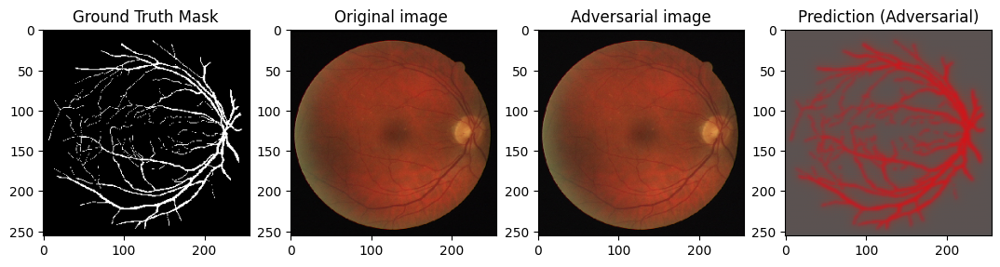

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


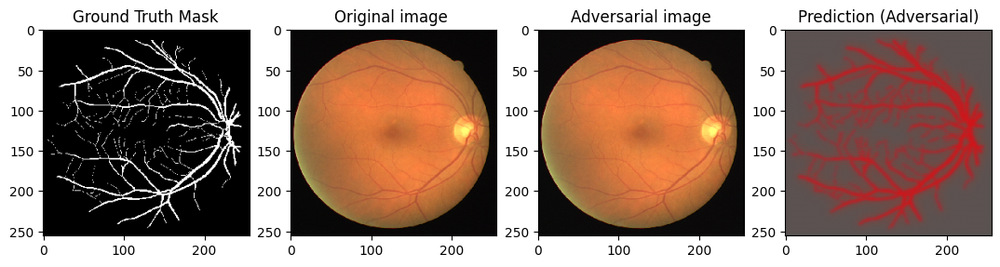

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


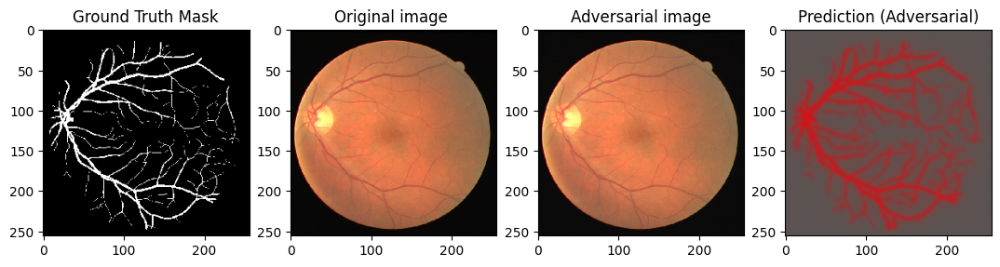

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


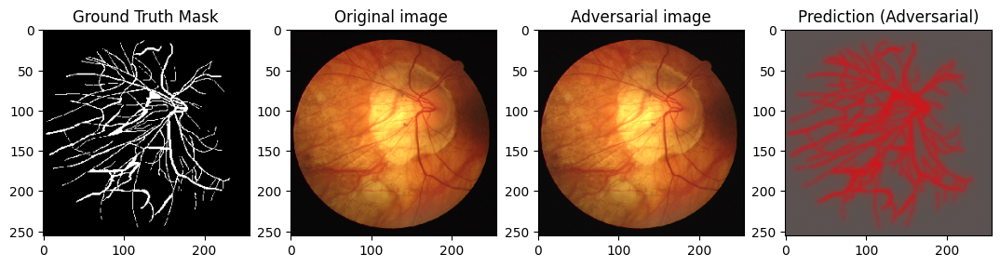

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model  # Import load_model
from sklearn.model_selection import train_test_split # Import train_test_split
import os # Import the os module
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator # Import necessary functions

# Define folders for images and labels
image_folder = '/content/drive/MyDrive/drive/drive/train/1st_manual'
manual_folder = '/content/drive/MyDrive/drive/drive/train/images'

# Function to load and preprocess images
def load_and_preprocess_images(image_folder, size=(256, 256)):
    image_list = []
    filenames = sorted(os.listdir(image_folder))  # Ensure matching order
    for filename in filenames:
        img_path = os.path.join(image_folder, filename)
        img = load_img(img_path, target_size=size)
        img_array = img_to_array(img) / 255.0  # Normalize images to [0, 1]
        image_list.append(img_array)
    return np.array(image_list), filenames

# Load images and manuals
images, _ = load_and_preprocess_images(image_folder)
manuals, _ = load_and_preprocess_images(manual_folder)

# Check if the number of samples in 'images' and 'manuals' match
if images.shape[0] != manuals.shape[0]:
    raise ValueError("The number of images and manuals does not match.")

# Load the trained model
model = load_model('/content/drive/MyDrive/UNET_Model.h5')

# Split data into training and testing sets
train_images, test_images, train_manuals, test_manuals = train_test_split(
    images, manuals, test_size=0.25, random_state=42
)

# FGSM attack function to create perturbation based on ground truth mask
def create_adversarial_pattern(input_image, input_label, model):
    with tf.GradientTape() as tape:
        tape.watch(input_image)
        prediction = model(input_image)
        loss = tf.keras.losses.categorical_crossentropy(input_label, prediction)

    # Get the gradients of the loss w.r.t to the input image.
    gradient = tape.gradient(loss, input_image)

    # Get the sign of the gradients to create the perturbation
    signed_grad = tf.sign(gradient)
    return signed_grad

# Generate adversarial images and masks based on ground truth
def generate_adversarial_images_and_masks(model, images, labels, epsilon=0.01):
    adversarial_images = []
    adversarial_labels = []
    for image, label in zip(images, labels):
        # Convert image and label to tensors
        image_tensor = tf.convert_to_tensor(image.reshape((1, *image.shape)), dtype=tf.float32)
        label_tensor = tf.convert_to_tensor(label.reshape((1, *label.shape)), dtype=tf.float32)

        # Generate adversarial image based on ground truth
        perturbation = create_adversarial_pattern(image_tensor, label_tensor, model)
        adversarial_image = image_tensor + epsilon * perturbation
        adversarial_image = tf.clip_by_value(adversarial_image, 0, 1)  # Ensure values are in [0, 1]
        adversarial_images.append(adversarial_image.numpy().squeeze())

        # Generate adversarial mask based on adversarial ground truth
        perturbation_label = create_adversarial_pattern(label_tensor, label_tensor, model)
        adversarial_label = label_tensor + epsilon * perturbation_label
        adversarial_label = tf.clip_by_value(adversarial_label, 0, 1)
        adversarial_labels.append(adversarial_label.numpy().squeeze())

    return np.array(adversarial_images), np.array(adversarial_labels)

# Set epsilon for adversarial perturbation
epsilon = 0.01

# Generate adversarial test images and masks
adversarial_test_images, adversarial_test_labels = generate_adversarial_images_and_masks(
    model, test_images, test_manuals, epsilon=epsilon
)

# Evaluate the model on the adversarial examples
adv_test_loss, adv_test_accuracy = model.evaluate(adversarial_test_images, adversarial_test_labels)
print(f"Adversarial Test Loss: {adv_test_loss}")
print(f"Adversarial Test Accuracy: {adv_test_accuracy}")

# Display sample adversarial predictions
def display_adversarial_prediction(index):
    plt.figure(figsize=(20, 8))

    # Original Image
    plt.subplot(1, 6, 1)
    plt.title("Ground Truth Mask")
    plt.imshow(test_images[index])

    # Ground Truth Mask
    plt.subplot(1, 6, 2)
    plt.title("Original image ")
    plt.imshow(test_manuals[index])

    # Adversarial Ground Truth Mask
    plt.subplot(1, 6, 3)
    plt.title("Adversarial image")
    plt.imshow(adversarial_test_labels[index])

    # Model Prediction for Adversarial Image
    adv_pred = model.predict(adversarial_test_images[index:index + 1])[0]
    plt.subplot(1, 6, 4)
    plt.title("Prediction (Adversarial)")
    plt.imshow(adv_pred,cmap="gray")

    plt.show()

# Display adversarial predictions for a few test samples
num_samples = min(5, len(test_images))  # Limit to available samples
for i in range(num_samples):
    display_adversarial_prediction(i)


**ADVERSIAL TRAINING FOR FGSM ATTACK**

Epoch 1/5
Test Loss: 0.32184240221977234, Test Accuracy: 1.0
Epoch 2/5
Test Loss: 0.32184240221977234, Test Accuracy: 1.0
Epoch 3/5
Test Loss: 0.32184240221977234, Test Accuracy: 1.0
Epoch 4/5
Test Loss: 0.32184240221977234, Test Accuracy: 1.0
Epoch 5/5


Test Loss: 0.32184240221977234, Test Accuracy: 1.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


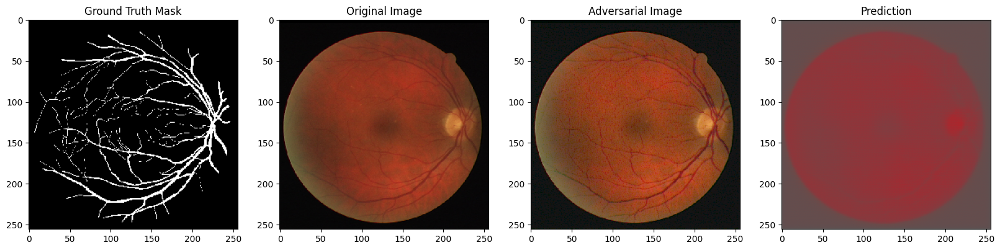

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


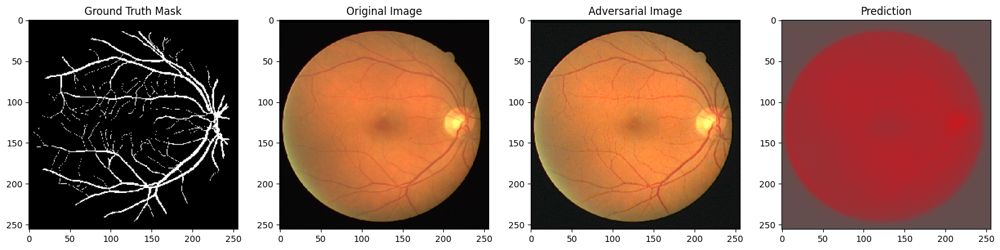

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


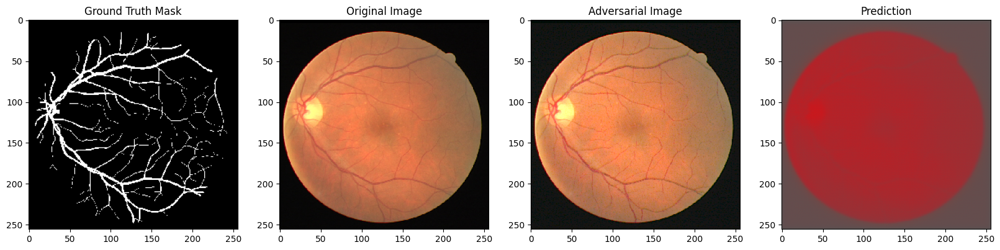

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


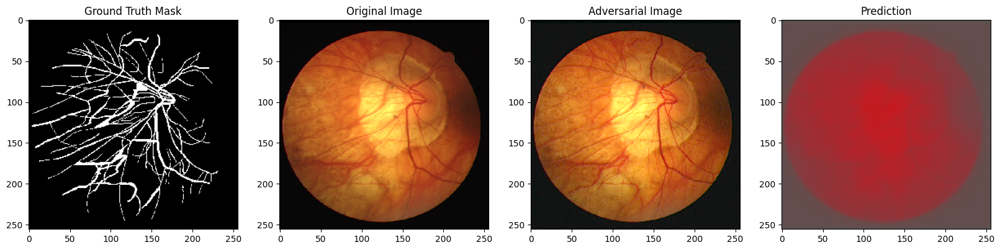

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from sklearn.model_selection import train_test_split
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Define folders for images and labels
image_folder = '/content/drive/MyDrive/drive/drive/train/images'
manual_folder = '/content/drive/MyDrive/drive/drive/train/1st_manual'

# Function to load and preprocess images
def load_and_preprocess_images(image_folder, size=(256, 256)):
    image_list = []
    filenames = sorted(os.listdir(image_folder))
    for filename in filenames:
        img_path = os.path.join(image_folder, filename)
        img = load_img(img_path, target_size=size)
        img_array = img_to_array(img) / 255.0
        image_list.append(img_array)
    return np.array(image_list), filenames

# Load images and manuals
images, _ = load_and_preprocess_images(image_folder)
manuals, _ = load_and_preprocess_images(manual_folder)

# Check if the number of samples in 'images' and 'manuals' match
if images.shape[0] != manuals.shape[0]:
    raise ValueError("The number of images and manuals does not match.")

# Load the trained model
model = load_model('/content/drive/MyDrive/UNET_Model.h5')

# Split data into training and testing sets
train_images, test_images, train_manuals, test_manuals = train_test_split(
    images, manuals, test_size=0.25, random_state=42
)

# FGSM attack function to create perturbation based on ground truth mask
def create_adversarial_pattern(input_image, input_label, model):
    with tf.GradientTape() as tape:
        tape.watch(input_image)
        prediction = model(input_image)
        loss = tf.keras.losses.categorical_crossentropy(input_label, prediction)

    gradient = tape.gradient(loss, input_image)
    signed_grad = tf.sign(gradient)
    return signed_grad

# Generate adversarial images and masks
def generate_adversarial_images(model, images, labels, epsilon=0.01):
    adversarial_images = []
    for image, label in zip(images, labels):
        image_tensor = tf.convert_to_tensor(image.reshape((1, *image.shape)), dtype=tf.float32)
        label_tensor = tf.convert_to_tensor(label.reshape((1, *label.shape)), dtype=tf.float32)
        perturbation = create_adversarial_pattern(image_tensor, label_tensor, model)
        adversarial_image = image_tensor + epsilon * perturbation
        adversarial_image = tf.clip_by_value(adversarial_image, 0, 1)
        adversarial_images.append(adversarial_image.numpy().squeeze())
    return np.array(adversarial_images)

# Adversarial training function
def adversarial_training(model, train_images, train_manuals, test_images, test_manuals, epochs=5, epsilon=0.01, batch_size=16):
    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")

        # Shuffle training data
        indices = np.arange(len(train_images))
        np.random.shuffle(indices)
        train_images = train_images[indices]
        train_manuals = train_manuals[indices]

        # Train on original and adversarial examples
        num_batches = len(train_images) // batch_size
        for i in range(num_batches):
            start = i * batch_size
            end = start + batch_size

            batch_images = train_images[start:end]
            batch_labels = train_manuals[start:end]

            adversarial_images = generate_adversarial_images(model, batch_images, batch_labels, epsilon)

            combined_images = np.concatenate([batch_images, adversarial_images])
            combined_labels = np.concatenate([batch_labels, batch_labels])

            model.train_on_batch(combined_images, combined_labels)

        # Evaluate on test data
        adversarial_test_images = generate_adversarial_images(model, test_images, test_manuals, epsilon)
        test_loss, test_accuracy = model.evaluate(adversarial_test_images, test_manuals, verbose=0)
        print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Set epsilon for adversarial perturbation
epsilon = 0.05

# Perform adversarial training
adversarial_training(model, train_images, train_manuals, test_images, test_manuals, epochs=5, epsilon=epsilon)

# Save the updated model
model.save('/content/drive/MyDrive/UNET_Model_Adversarial_Trained.h5')

# Display sample adversarial predictions
def display_adversarial_prediction(index):
    plt.figure(figsize=(20, 8))

    # Original Image
    plt.subplot(1, 4, 1)
    plt.title("Ground Truth Mask")
    plt.imshow(test_manuals[index])

    # Ground Truth Mask
    plt.subplot(1, 4, 2)
    plt.title("Original Image")
    plt.imshow(test_images[index])

    # Adversarial Image
    adversarial_image = generate_adversarial_images(model, [test_images[index]], [test_manuals[index]], epsilon=epsilon)[0]
    plt.subplot(1, 4, 3)
    plt.title("Adversarial Image")
    plt.imshow(adversarial_image)

    # Prediction
    adv_pred = model.predict(adversarial_image.reshape((1, *adversarial_image.shape)))[0]
    plt.subplot(1, 4, 4)
    plt.title("Prediction")
    plt.imshow(adv_pred, cmap="gray")

    plt.show()

# Display predictions for a few test samples
num_samples = min(5, len(test_images))
for i in range(num_samples):
    display_adversarial_prediction(i)


In [ ]:
# Function to compute Dice Score for a single pair of prediction and ground truth
def compute_dice_score(prediction, ground_truth, threshold=0.5):
    # Binarize predictions and ground truth masks
    prediction = (prediction >= threshold).astype(np.float32)
    ground_truth = (ground_truth >= threshold).astype(np.float32)

    # Calculate intersection and union
    intersection = np.sum(prediction * ground_truth)
    union = np.sum(prediction) + np.sum(ground_truth)

    # Compute Dice Score
    dice_score = (2.0 * intersection) / (union + 1e-7)  # Add small epsilon to avoid division by zero
    return dice_score

# Function to evaluate Dice Score on the entire test set
def evaluate_dice_score(model, test_images, test_labels, threshold=0.5):
    dice_scores = []
    for image, label in zip(test_images, test_labels):
        # Predict using the model
        prediction = model.predict(image[np.newaxis, ...])[0]  # Predict single image

        # Compute Dice Score for this prediction
        dice_score = compute_dice_score(prediction, label, threshold)
        dice_scores.append(dice_score)

    # Calculate mean Dice Score
    mean_dice_score = np.mean(dice_scores)
    return mean_dice_score, dice_scores

# Evaluate Dice Score on adversarial examples
mean_dice, dice_scores = evaluate_dice_score(model, adversarial_test_images, adversarial_test_labels)
print(f"Mean Dice Score on Adversarial Examples: {mean_dice:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Mean Dice Score on Adversarial Examples: 0.3044


Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 86s 86s/step - accuracy: 0.9713 - loss: 0.6345 - val_accuracy: 0.9737 - val_loss: 21.9316
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 79s 79s/step - accuracy: 0.9740 - loss: 22.6814 - val_accuracy: 0.4837 - val_loss: 0.6292
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 83s 83s/step - accuracy: 0.4866 - loss: 0.6460 - val_accuracy: 0.3953 - val_loss: 0.6685
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 90s 90s/step - accuracy: 0.4084 - loss: 0.6689 - val_accuracy: 0.5745 - val_loss: 0.6711
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 146s 146s/step - accuracy: 0.5855 - loss: 0.6712 - val_accuracy: 0.4438 - val_loss: 0.6710
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 128s 128s/step - accuracy: 0.4585 - loss: 0.6712 - val_accuracy: 0.4444 - val_loss: 0.6703
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 84s 84s/step - accuracy: 0.4591 - loss: 0.6706 - val_accuracy: 0.4481 - val_loss: 0.6692
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 82s 82s/step - accuracy: 0.4627 - loss: 0.6696 - val_accuracy: 0.6926 - val_loss: 0

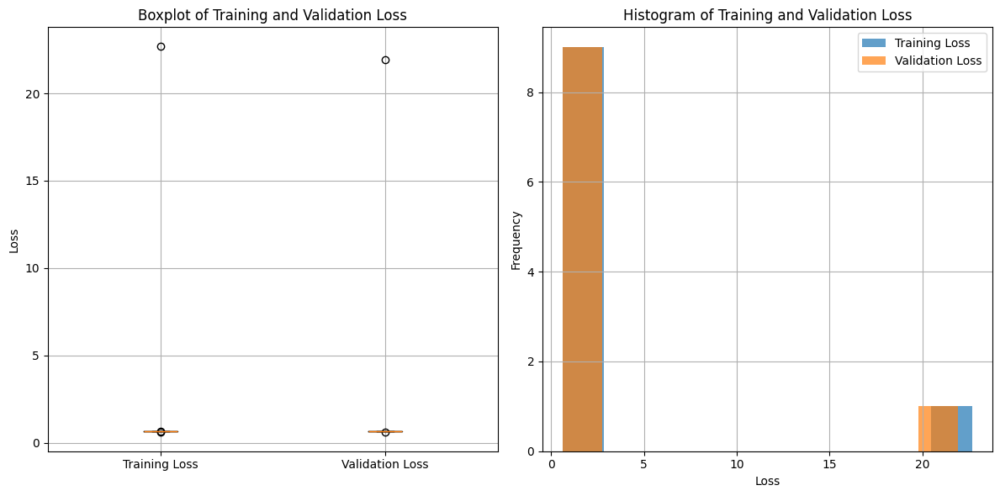

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'history' contains the training history from model.fit()
# For example: history = model.fit(train_data, validation_data=val_data, epochs=10)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_images, train_manuals, epochs=10, batch_size=32, validation_data=(test_images, test_manuals))
# Extract training and validation loss from history
training_loss = history.history['loss']
validation_loss = history.history['val_loss']

# Plot Boxplot for Training and Validation Loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.boxplot([training_loss, validation_loss], labels=['Training Loss', 'Validation Loss'])
plt.title('Boxplot of Training and Validation Loss')
plt.ylabel('Loss')
plt.grid(True)

# Plot Histogram for Training and Validation Loss
plt.subplot(1, 2, 2)
plt.hist(training_loss, bins=10, alpha=0.7, label='Training Loss')
plt.hist(validation_loss, bins=10, alpha=0.7, label='Validation Loss')
plt.title('Histogram of Training and Validation Loss')
plt.xlabel('Loss')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

PGD ATTACK PREDICTION

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model file found at: /content/drive/MyDrive/UNET_Model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - accuracy: 0.9737 - loss: 0.9634
Adversarial Test Loss: 0.9633901119232178
Adversarial Test Accuracy: 0.9737434387207031
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


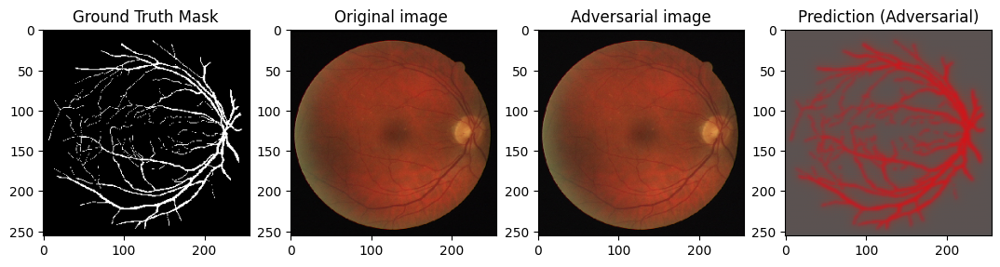

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


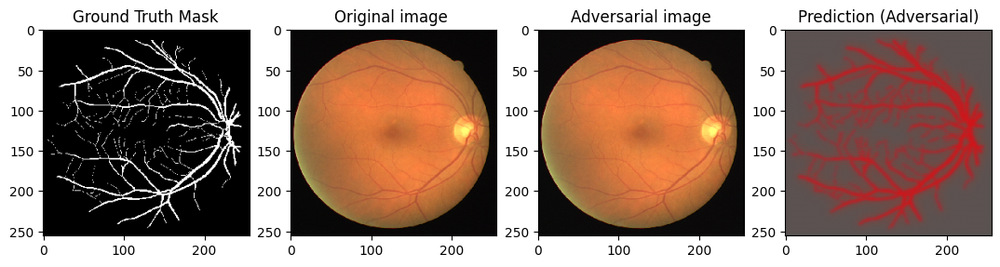

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


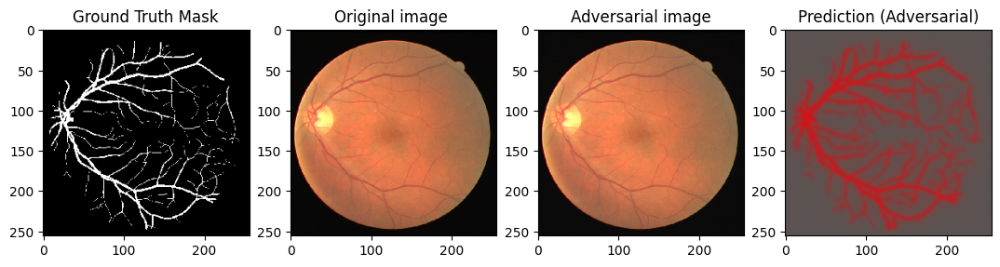

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


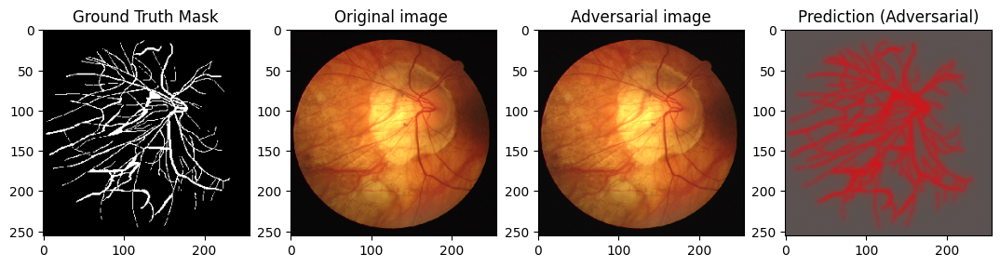

In [ ]:


import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model  # Import load_model
from sklearn.model_selection import train_test_split # Import train_test_split
import os # Import the os module
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator # Import necessary functions
from google.colab import drive

drive.mount('/content/drive')
# Define folders for images and labels
image_folder = '/content/drive/MyDrive/drive/drive/train/1st_manual'
manual_folder = '/content/drive/MyDrive/drive/drive/train/images'


# Function to load and preprocess images
def load_and_preprocess_images(image_folder, size=(256, 256)):
    image_list = []
    filenames = sorted(os.listdir(image_folder))  # Ensure matching order
    for filename in filenames:
        img_path = os.path.join(image_folder, filename)
        img = load_img(img_path, target_size=size)
        img_array = img_to_array(img) / 255.0  # Normalize images to [0, 1]
        image_list.append(img_array)
    return np.array(image_list), filenames

# Load images and manuals
images, _ = load_and_preprocess_images(image_folder)
manuals, _ = load_and_preprocess_images(manual_folder)

# Check if the number of samples in 'images' and 'manuals' match
if images.shape[0] != manuals.shape[0]:
    raise ValueError("The number of images and manuals does not match.")

# *Define the file path to your model*
file_path = ('/content/drive/MyDrive/UNET_Model.h5')

# *Check if the file exists and print helpful messages*
if not os.path.exists(file_path):
    # If the file doesn't exist, print an error message and stop
    raise FileNotFoundError(f"Error: The model file '{file_path}' was not found. "
                            f"Please ensure the file exists at this location. "
                            f"If the file is in Google Drive, make sure your Drive is mounted correctly.")
else:
    print(f"Model file found at: {file_path}")

# Load the trained model
model = load_model(file_path)

# Split data into training and testing sets
train_images, test_images, train_manuals, test_manuals = train_test_split(
    images, manuals, test_size=0.25, random_state=42
)

# PGD attack function to create perturbation based on ground truth mask
def create_adversarial_pattern(input_image, input_label, model):
    with tf.GradientTape() as tape:
        tape.watch(input_image)
        prediction = model(input_image)
        loss = tf.keras.losses.categorical_crossentropy(input_label, prediction)

    # Get the gradients of the loss w.r.t to the input image.
    gradient = tape.gradient(loss, input_image)

    # Get the sign of the gradients to create the perturbation
    signed_grad = tf.sign(gradient)
    return signed_grad

# Generate adversarial images and masks based on ground truth
def generate_adversarial_images_and_masks(model, images, labels, epsilon=0.01):
    adversarial_images = []
    adversarial_labels = []
    for image, label in zip(images, labels):
        # Convert image and label to tensors
        image_tensor = tf.convert_to_tensor(image.reshape((1, *image.shape)), dtype=tf.float32)
        label_tensor = tf.convert_to_tensor(label.reshape((1, *label.shape)), dtype=tf.float32)

        # Generate adversarial image based on ground truth
        perturbation = create_adversarial_pattern(image_tensor, label_tensor, model)
        adversarial_image = image_tensor + epsilon * perturbation
        adversarial_image = tf.clip_by_value(adversarial_image, 0, 1)  # Ensure values are in [0, 1]
        adversarial_images.append(adversarial_image.numpy().squeeze())

        # Generate adversarial mask based on adversarial ground truth
        perturbation_label = create_adversarial_pattern(label_tensor, label_tensor, model)
        adversarial_label = label_tensor + epsilon * perturbation_label
        adversarial_label = tf.clip_by_value(adversarial_label, 0, 1)
        adversarial_labels.append(adversarial_label.numpy().squeeze())

    return np.array(adversarial_images), np.array(adversarial_labels)

# Set epsilon for adversarial perturbation
epsilon = 0.01

# Generate adversarial test images and masks
adversarial_test_images, adversarial_test_labels = generate_adversarial_images_and_masks(
    model, test_images, test_manuals, epsilon=epsilon
)

# Evaluate the model on the adversarial examples
adv_test_loss, adv_test_accuracy = model.evaluate(adversarial_test_images, adversarial_test_labels)
print(f"Adversarial Test Loss: {adv_test_loss}")
print(f"Adversarial Test Accuracy: {adv_test_accuracy}")

# Display sample adversarial predictions
def display_adversarial_prediction(index):
    plt.figure(figsize=(20, 8))

    # Original Image
    plt.subplot(1, 6, 1)
    plt.title("Ground Truth Mask")
    plt.imshow(test_images[index])

    # Ground Truth Mask
    plt.subplot(1, 6, 2)
    plt.title("Original image ")
    plt.imshow(test_manuals[index])

    # Adversarial Ground Truth Mask
    plt.subplot(1, 6, 3)
    plt.title("Adversarial image")
    plt.imshow(adversarial_test_labels[index])

    # Model Prediction for Adversarial Image
    adv_pred = model.predict(adversarial_test_images[index:index + 1])[0]
    plt.subplot(1, 6, 4)
    plt.title("Prediction (Adversarial)")
    plt.imshow(adv_pred)

    plt.show()

# Display adversarial predictions for a few test samples
num_samples = min(10, len(test_images))  # Limit to available samples
for i in range(num_samples):
    display_adversarial_prediction(i)


**ADVERSIAL TRAINING FOR PGD ATTACK**

Epoch 1/5
Test Loss: 0.3219166100025177, Test Accuracy: 1.0
Epoch 2/5
Test Loss: 0.3219166100025177, Test Accuracy: 1.0
Epoch 3/5
Test Loss: 0.3219166100025177, Test Accuracy: 1.0
Epoch 4/5
Test Loss: 0.3219166100025177, Test Accuracy: 1.0
Epoch 5/5


Test Loss: 0.3219166100025177, Test Accuracy: 1.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


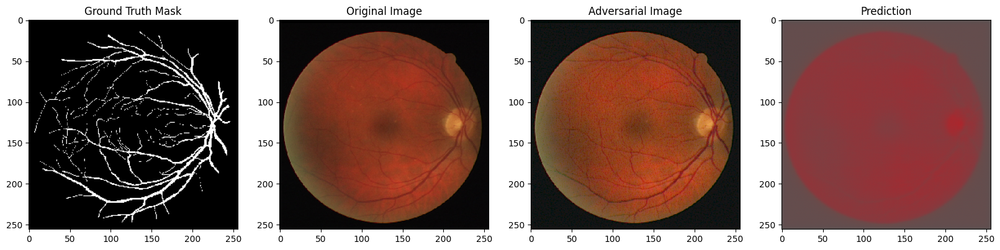

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


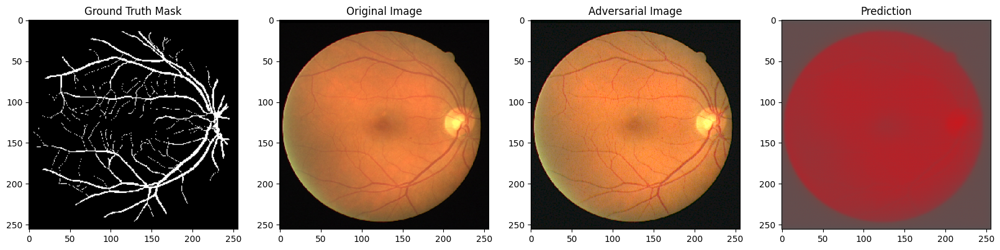

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


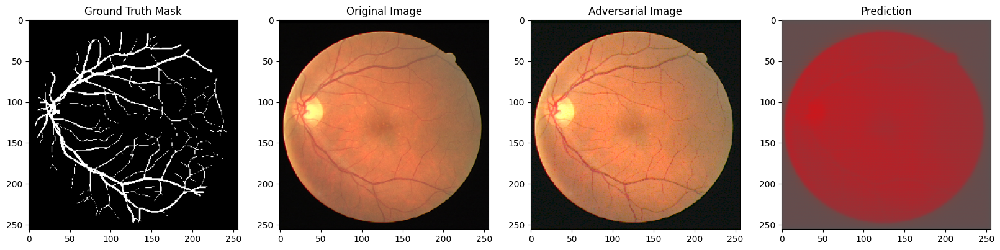

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


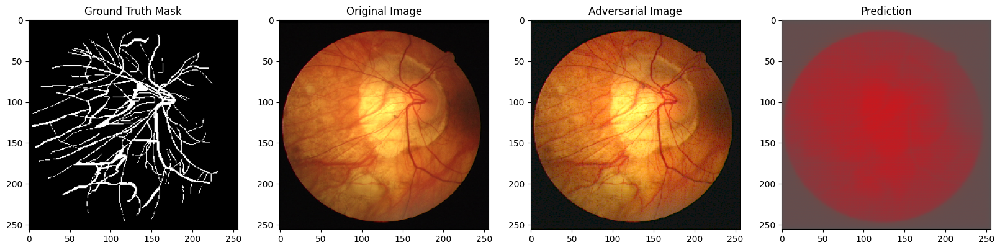

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from sklearn.model_selection import train_test_split
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Define folders for images and labels
image_folder = '/content/drive/MyDrive/drive/drive/train/images'
manual_folder = '/content/drive/MyDrive/drive/drive/train/1st_manual'

# Function to load and preprocess images
def load_and_preprocess_images(image_folder, size=(256, 256)):
    image_list = []
    filenames = sorted(os.listdir(image_folder))
    for filename in filenames:
        img_path = os.path.join(image_folder, filename)
        img = load_img(img_path, target_size=size)
        img_array = img_to_array(img) / 255.0
        image_list.append(img_array)
    return np.array(image_list), filenames

# Load images and manuals
images, _ = load_and_preprocess_images(image_folder)
manuals, _ = load_and_preprocess_images(manual_folder)

# Check if the number of samples in 'images' and 'manuals' match
if images.shape[0] != manuals.shape[0]:
    raise ValueError("The number of images and manuals does not match.")

# Load the trained model
model = load_model('/content/drive/MyDrive/UNET_Model.h5')

# Split data into training and testing sets
train_images, test_images, train_manuals, test_manuals = train_test_split(
    images, manuals, test_size=0.25, random_state=42
)

# PGD attack function
def generate_pgd_adversarial_images(model, images, labels, epsilon=0.01, alpha=0.001, iterations=10):
    adversarial_images = []
    for image, label in zip(images, labels):
        image_tensor = tf.convert_to_tensor(image.reshape((1, *image.shape)), dtype=tf.float32)
        label_tensor = tf.convert_to_tensor(label.reshape((1, *label.shape)), dtype=tf.float32)

        # Start with the original image
        adv_image = tf.identity(image_tensor)

        for _ in range(iterations):
            with tf.GradientTape() as tape:
                tape.watch(adv_image)
                prediction = model(adv_image)
                loss = tf.keras.losses.categorical_crossentropy(label_tensor, prediction)

            # Calculate gradient
            gradient = tape.gradient(loss, adv_image)
            signed_grad = tf.sign(gradient)

            # Update adversarial image
            adv_image = adv_image + alpha * signed_grad
            adv_image = tf.clip_by_value(adv_image, image_tensor - epsilon, image_tensor + epsilon)
            adv_image = tf.clip_by_value(adv_image, 0, 1)

        adversarial_images.append(adv_image.numpy().squeeze())
    return np.array(adversarial_images)

# Adversarial training function
def adversarial_training(model, train_images, train_manuals, test_images, test_manuals, epochs=5, epsilon=0.01, alpha=0.001, iterations=10, batch_size=16):
    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")

        # Shuffle training data
        indices = np.arange(len(train_images))
        np.random.shuffle(indices)
        train_images = train_images[indices]
        train_manuals = train_manuals[indices]

        # Train on original and adversarial examples
        num_batches = len(train_images) // batch_size
        for i in range(num_batches):
            start = i * batch_size
            end = start + batch_size

            batch_images = train_images[start:end]
            batch_labels = train_manuals[start:end]

            adversarial_images = generate_pgd_adversarial_images(
                model, batch_images, batch_labels, epsilon, alpha, iterations
            )

            combined_images = np.concatenate([batch_images, adversarial_images])
            combined_labels = np.concatenate([batch_labels, batch_labels])

            model.train_on_batch(combined_images, combined_labels)

        # Evaluate on test data
        adversarial_test_images = generate_pgd_adversarial_images(
            model, test_images, test_manuals, epsilon, alpha, iterations
        )
        test_loss, test_accuracy = model.evaluate(adversarial_test_images, test_manuals, verbose=0)
        print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Set parameters for PGD
epsilon = 0.05
alpha = 0.01
iterations = 10

# Perform adversarial training
adversarial_training(model, train_images, train_manuals, test_images, test_manuals, epochs=5, epsilon=epsilon, alpha=alpha, iterations=iterations)

# Save the updated model
model.save('/content/drive/MyDrive/UNET_Model_PGD_Trained.h5')

# Display sample adversarial predictions
def display_adversarial_prediction(index):
    plt.figure(figsize=(20, 8))

    # Original Image
    plt.subplot(1, 4, 1)
    plt.title("Ground Truth Mask")
    plt.imshow(test_manuals[index])

    # Original Image
    plt.subplot(1, 4, 2)
    plt.title("Original Image")
    plt.imshow(test_images[index])

    # Adversarial Image
    adversarial_image = generate_pgd_adversarial_images(
        model, [test_images[index]], [test_manuals[index]], epsilon=epsilon, alpha=alpha, iterations=iterations
    )[0]
    plt.subplot(1, 4, 3)
    plt.title("Adversarial Image")
    plt.imshow(adversarial_image)

    # Prediction
    adv_pred = model.predict(adversarial_image.reshape((1, *adversarial_image.shape)))[0]
    plt.subplot(1, 4, 4)
    plt.title("Prediction")
    plt.imshow(adv_pred, cmap="gray")

    plt.show()

# Display predictions for a few test samples
num_samples = min(5, len(test_images))
for i in range(num_samples):
    display_adversarial_prediction(i)


In [ ]:
# Function to compute Dice Score for a single pair of prediction and ground truth
def compute_dice_score(prediction, ground_truth, threshold=0.5):
    # Binarize predictions and ground truth masks
    prediction = (prediction >= threshold).astype(np.float32)
    ground_truth = (ground_truth >= threshold).astype(np.float32)

    # Calculate intersection and union
    intersection = np.sum(prediction * ground_truth)
    union = np.sum(prediction) + np.sum(ground_truth)

    # Compute Dice Score
    dice_score = (2.0 * intersection) / (union + 1e-7)  # Add small epsilon to avoid division by zero
    return dice_score

# Function to evaluate Dice Score on the entire test set
def evaluate_dice_score(model, test_images, test_labels, threshold=0.5):
    dice_scores = []
    for image, label in zip(test_images, test_labels):
        # Predict using the model
        prediction = model.predict(image[np.newaxis, ...])[0]  # Predict single image

        # Compute Dice Score for this prediction
        dice_score = compute_dice_score(prediction, label, threshold)
        dice_scores.append(dice_score)

    # Calculate mean Dice Score
    mean_dice_score = np.mean(dice_scores)
    return mean_dice_score, dice_scores

# Evaluate Dice Score on adversarial examples
mean_dice, dice_scores = evaluate_dice_score(model, adversarial_test_images, adversarial_test_labels)
print(f"Mean Dice Score on Adversarial Examples: {mean_dice:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Mean Dice Score on Adversarial Examples: 0.5164


Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 81s 81s/step - accuracy: 0.9740 - loss: 0.6641 - val_accuracy: 0.9737 - val_loss: 2.3617
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 74s 74s/step - accuracy: 0.9740 - loss: 2.3202 - val_accuracy: 0.9737 - val_loss: 0.6498
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 80s 80s/step - accuracy: 0.9740 - loss: 0.6448 - val_accuracy: 0.9702 - val_loss: 0.6727
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 74s 74s/step - accuracy: 0.9702 - loss: 0.6710 - val_accuracy: 0.9384 - val_loss: 0.6762
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 87s 87s/step - accuracy: 0.9370 - loss: 0.6752 - val_accuracy: 0.6852 - val_loss: 0.6747
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 74s 74s/step - accuracy: 0.6906 - loss: 0.6739 - val_accuracy: 0.5666 - val_loss: 0.6708
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 72s 72s/step - accuracy: 0.5680 - loss: 0.6682 - val_accuracy: 0.8075 - val_loss: 0.6660
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 84s 84s/step - accuracy: 0.8107 - loss: 0.6653 - val_accuracy: 0.9288 - val_loss: 0.6510


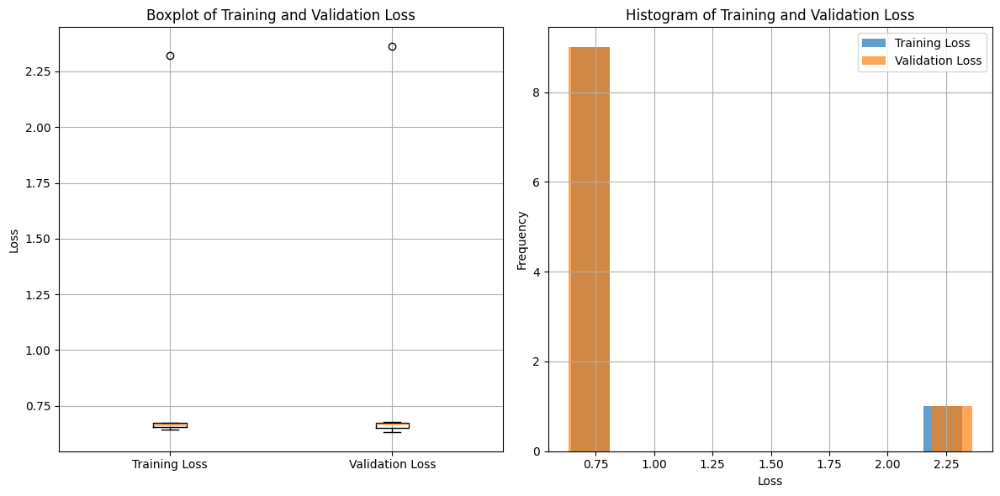

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'history' contains the training history from model.fit()
# For example: history = model.fit(train_data, validation_data=val_data, epochs=10)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_images, train_manuals, epochs=10, batch_size=32, validation_data=(test_images, test_manuals))
# Extract training and validation loss from history
training_loss = history.history['loss']
validation_loss = history.history['val_loss']

# Plot Boxplot for Training and Validation Loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.boxplot([training_loss, validation_loss], labels=['Training Loss', 'Validation Loss'])
plt.title('Boxplot of Training and Validation Loss')
plt.ylabel('Loss')
plt.grid(True)

# Plot Histogram for Training and Validation Loss
plt.subplot(1, 2, 2)
plt.hist(training_loss, bins=10, alpha=0.7, label='Training Loss')
plt.hist(validation_loss, bins=10, alpha=0.7, label='Validation Loss')
plt.title('Histogram of Training and Validation Loss')
plt.xlabel('Loss')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

BIM ATTACK PREDICTION

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model file found at: /content/drive/MyDrive/UNET_Model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - accuracy: 0.9136 - loss: 0.9286
Adversarial Test Loss: 0.9286198616027832
Adversarial Test Accuracy: 0.9136199951171875
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


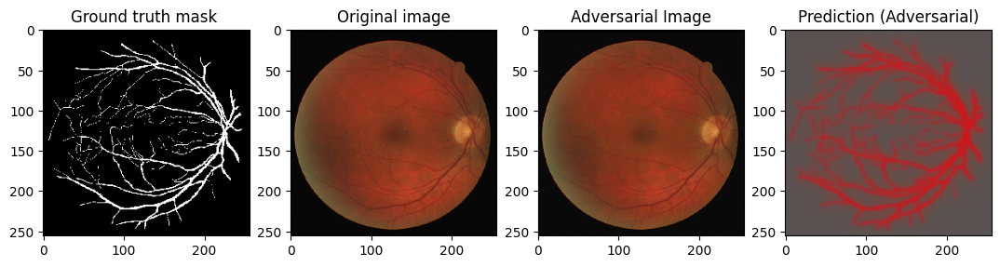

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


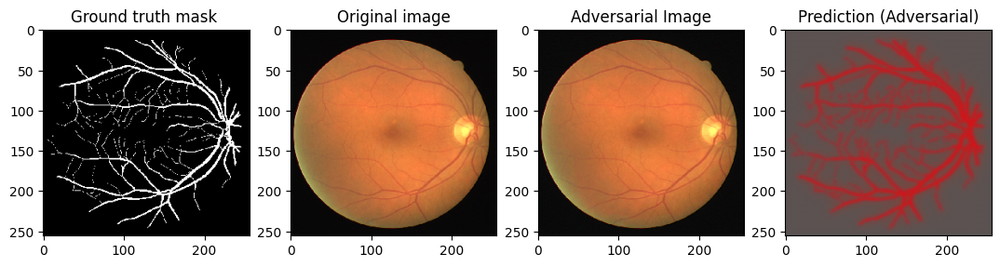

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


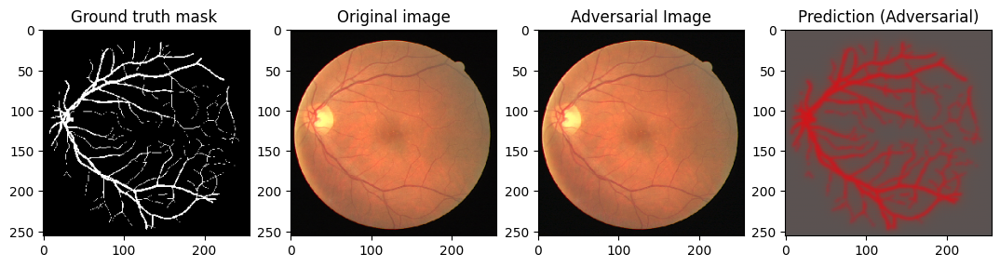

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


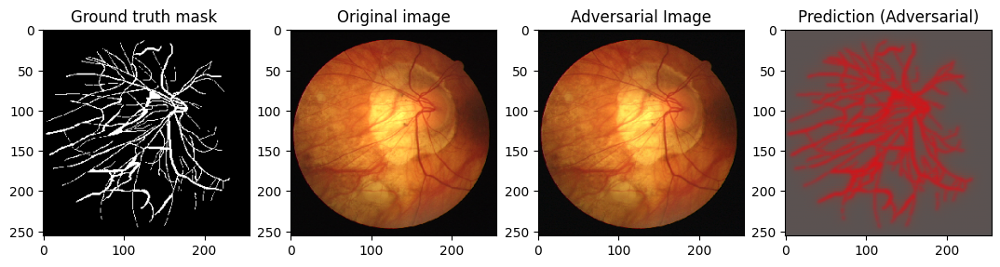

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from sklearn.model_selection import train_test_split
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define folders for images and labels
image_folder = '/content/drive/MyDrive/drive/drive/train/1st_manual'
manual_folder = '/content/drive/MyDrive/drive/drive/train/images'

# Function to load and preprocess images
def load_and_preprocess_images(image_folder, size=(256, 256)):
    image_list = []
    filenames = sorted(os.listdir(image_folder))
    for filename in filenames:
        img_path = os.path.join(image_folder, filename)
        img = load_img(img_path, target_size=size)
        img_array = img_to_array(img) / 255.0  # Normalize images to [0, 1]
        image_list.append(img_array)
    return np.array(image_list), filenames

# Load images and labels
images, _ = load_and_preprocess_images(image_folder)
manuals, _ = load_and_preprocess_images(manual_folder)

# Check if the number of samples in 'images' and 'manuals' match
if images.shape[0] != manuals.shape[0]:
    raise ValueError("The number of images and manuals does not match.")

# Define the file path to your model
file_path = '/content/drive/MyDrive/UNET_Model.h5'

# Check if the file exists
if not os.path.exists(file_path):
    raise FileNotFoundError(f"Error: The model file '{file_path}' was not found.")
else:
    print(f"Model file found at: {file_path}")

# Load the trained model
model = load_model(file_path)

# Split data into training and testing sets
train_images, test_images, train_manuals, test_manuals = train_test_split(
    images, manuals, test_size=0.25, random_state=42
)

# BIM attack function with multiple iterations
def create_bim_adversarial_pattern(input_image, input_label, model, epsilon=0.01, alpha=0.005, iterations=10):
    adv_image = tf.identity(input_image)
    for i in range(iterations):
        with tf.GradientTape() as tape:
            tape.watch(adv_image)
            prediction = model(adv_image)
            loss = tf.keras.losses.categorical_crossentropy(input_label, prediction)

        # Calculate gradient and perturbation
        gradient = tape.gradient(loss, adv_image)
        signed_grad = tf.sign(gradient)
        adv_image = adv_image + alpha * signed_grad
        adv_image = tf.clip_by_value(adv_image, input_image - epsilon, input_image + epsilon)
        adv_image = tf.clip_by_value(adv_image, 0, 1)  # Ensure values are in [0, 1]

    return adv_image

# Generate BIM adversarial images and masks
def generate_bim_adversarial_images_and_masks(model, images, labels, epsilon=0.01, alpha=0.005, iterations=10):
    adversarial_images = []
    adversarial_labels = []
    for image, label in zip(images, labels):
        image_tensor = tf.convert_to_tensor(image.reshape((1, *image.shape)), dtype=tf.float32)
        label_tensor = tf.convert_to_tensor(label.reshape((1, *label.shape)), dtype=tf.float32)

        # Generate adversarial image with BIM attack
        adversarial_image = create_bim_adversarial_pattern(image_tensor, label_tensor, model, epsilon, alpha, iterations)
        adversarial_images.append(adversarial_image.numpy().squeeze())

        # Generate adversarial mask with BIM attack
        adversarial_label = create_bim_adversarial_pattern(label_tensor, label_tensor, model, epsilon, alpha, iterations)
        adversarial_labels.append(adversarial_label.numpy().squeeze())

    return np.array(adversarial_images), np.array(adversarial_labels)

# Set epsilon, alpha, and iterations for BIM attack
epsilon = 0.01
alpha = 0.005
iterations = 10

# Generate adversarial test images and masks using BIM
adversarial_test_images, adversarial_test_labels = generate_bim_adversarial_images_and_masks(
    model, test_images, test_manuals, epsilon=epsilon, alpha=alpha, iterations=iterations
)

# Evaluate the model on the BIM adversarial examples
adv_test_loss, adv_test_accuracy = model.evaluate(adversarial_test_images, adversarial_test_labels)
print(f"Adversarial Test Loss: {adv_test_loss}")
print(f"Adversarial Test Accuracy: {adv_test_accuracy}")

# Display sample adversarial predictions
def display_bim_adversarial_prediction(index):
    plt.figure(figsize=(20, 8))

    # Original Image
    plt.subplot(1, 6, 1)
    plt.title("Ground truth mask ")
    plt.imshow(test_images[index])

    # Ground Truth Mask
    plt.subplot(1, 6, 2)
    plt.title("Original image")
    plt.imshow(test_manuals[index])

    # Adversarial Image
    #plt.subplot(1, 6, 3)
    #plt.title("Adversarial Image")
    #plt.imshow(adversarial_test_images[index])

    # Adversarial Ground Truth Mask
    plt.subplot(1, 6, 3)
    plt.title("Adversarial Image")
    plt.imshow(adversarial_test_labels[index])

    # Model Prediction for Adversarial Image
    adv_pred = model.predict(adversarial_test_images[index:index + 1])[0]
    plt.subplot(1, 6, 4)
    plt.title("Prediction (Adversarial)")
    plt.imshow(adv_pred)

    plt.show()

# Display BIM adversarial predictions for a few test samples
num_samples = min(10, len(test_images))
for i in range(num_samples):
    display_bim_adversarial_prediction(i)


**ADVERSIAL TRAINING ON BIM ATTACK**

Epoch 1/5
Test Loss: 0.32191890478134155, Test Accuracy: 1.0
Epoch 2/5
Test Loss: 0.32191890478134155, Test Accuracy: 1.0
Epoch 3/5
Test Loss: 0.32191890478134155, Test Accuracy: 1.0
Epoch 4/5
Test Loss: 0.32191890478134155, Test Accuracy: 1.0
Epoch 5/5


Test Loss: 0.32191890478134155, Test Accuracy: 1.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


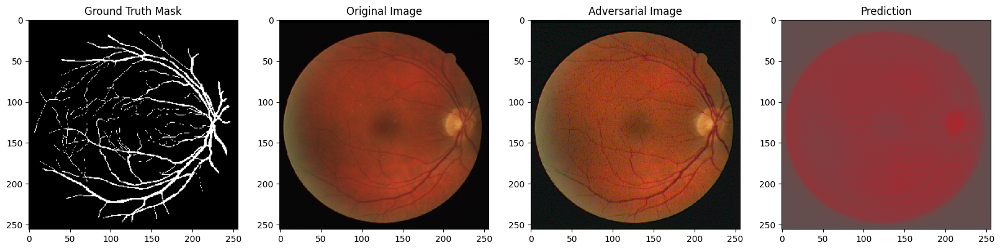

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


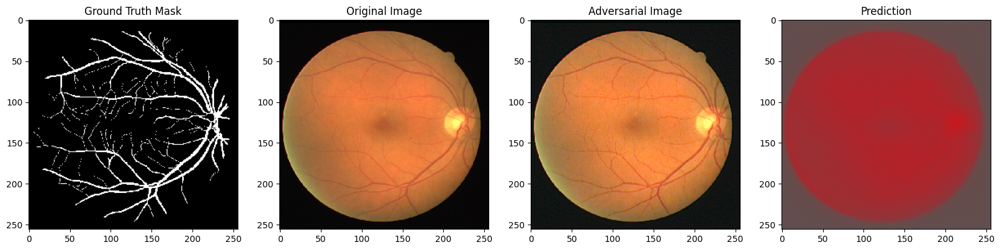

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


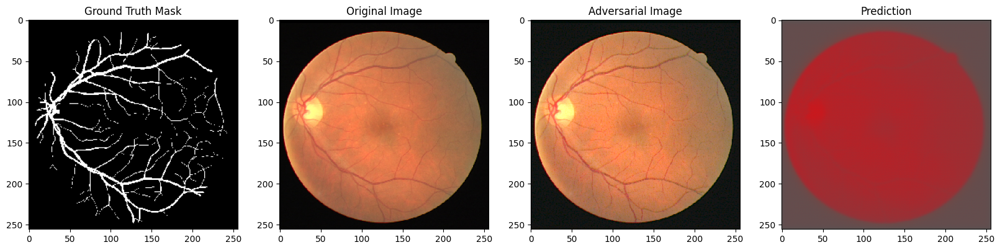

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


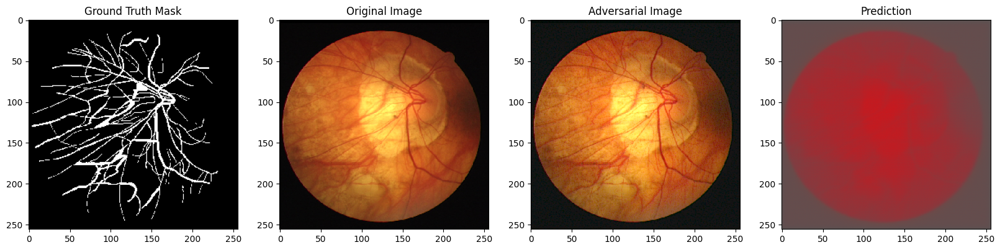

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from sklearn.model_selection import train_test_split
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Define folders for images and labels
image_folder = '/content/drive/MyDrive/drive/drive/train/images'
manual_folder = '/content/drive/MyDrive/drive/drive/train/1st_manual'

# Function to load and preprocess images
def load_and_preprocess_images(image_folder, size=(256, 256)):
    image_list = []
    filenames = sorted(os.listdir(image_folder))
    for filename in filenames:
        img_path = os.path.join(image_folder, filename)
        img = load_img(img_path, target_size=size)
        img_array = img_to_array(img) / 255.0
        image_list.append(img_array)
    return np.array(image_list), filenames

# Load images and manuals
images, _ = load_and_preprocess_images(image_folder)
manuals, _ = load_and_preprocess_images(manual_folder)

# Check if the number of samples in 'images' and 'manuals' match
if images.shape[0] != manuals.shape[0]:
    raise ValueError("The number of images and manuals does not match.")

# Load the trained model
model = load_model('/content/drive/MyDrive/UNET_Model.h5')

# Split data into training and testing sets
train_images, test_images, train_manuals, test_manuals = train_test_split(
    images, manuals, test_size=0.25, random_state=42
)

# BIM attack function
def generate_bim_adversarial_images(model, images, labels, epsilon=0.01, alpha=0.001, iterations=10):
    adversarial_images = []
    for image, label in zip(images, labels):
        image_tensor = tf.convert_to_tensor(image.reshape((1, *image.shape)), dtype=tf.float32)
        label_tensor = tf.convert_to_tensor(label.reshape((1, *label.shape)), dtype=tf.float32)

        # Start with the original image
        adv_image = tf.identity(image_tensor)

        for _ in range(iterations):
            with tf.GradientTape() as tape:
                tape.watch(adv_image)
                prediction = model(adv_image)
                loss = tf.keras.losses.categorical_crossentropy(label_tensor, prediction)

            # Calculate gradient
            gradient = tape.gradient(loss, adv_image)
            signed_grad = tf.sign(gradient)

            # Update adversarial image
            adv_image = adv_image + alpha * signed_grad
            adv_image = tf.clip_by_value(adv_image, 0, 1)

        # Ensure perturbation is within epsilon bounds
        adv_image = tf.clip_by_value(adv_image, image_tensor - epsilon, image_tensor + epsilon)
        adversarial_images.append(adv_image.numpy().squeeze())
    return np.array(adversarial_images)

# Adversarial training function
def adversarial_training(model, train_images, train_manuals, test_images, test_manuals, epochs=5, epsilon=0.01, alpha=0.001, iterations=10, batch_size=16):
    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")

        # Shuffle training data
        indices = np.arange(len(train_images))
        np.random.shuffle(indices)
        train_images = train_images[indices]
        train_manuals = train_manuals[indices]

        # Train on original and adversarial examples
        num_batches = len(train_images) // batch_size
        for i in range(num_batches):
            start = i * batch_size
            end = start + batch_size

            batch_images = train_images[start:end]
            batch_labels = train_manuals[start:end]

            adversarial_images = generate_bim_adversarial_images(
                model, batch_images, batch_labels, epsilon, alpha, iterations
            )

            combined_images = np.concatenate([batch_images, adversarial_images])
            combined_labels = np.concatenate([batch_labels, batch_labels])

            model.train_on_batch(combined_images, combined_labels)

        # Evaluate on test data
        adversarial_test_images = generate_bim_adversarial_images(
            model, test_images, test_manuals, epsilon, alpha, iterations
        )
        test_loss, test_accuracy = model.evaluate(adversarial_test_images, test_manuals, verbose=0)
        print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Set parameters for BIM
epsilon = 0.05
alpha = 0.01
iterations = 10

# Perform adversarial training
adversarial_training(model, train_images, train_manuals, test_images, test_manuals, epochs=5, epsilon=epsilon, alpha=alpha, iterations=iterations)

# Save the updated model
model.save('/content/drive/MyDrive/UNET_Model_BIM_Trained.h5')

# Display sample adversarial predictions
def display_adversarial_prediction(index):
    plt.figure(figsize=(20, 8))

    # Original Image
    plt.subplot(1, 4, 1)
    plt.title("Ground Truth Mask")
    plt.imshow(test_manuals[index])

    # Original Image
    plt.subplot(1, 4, 2)
    plt.title("Original Image")
    plt.imshow(test_images[index])

    # Adversarial Image
    adversarial_image = generate_bim_adversarial_images(
        model, [test_images[index]], [test_manuals[index]], epsilon=epsilon, alpha=alpha, iterations=iterations
    )[0]
    plt.subplot(1, 4, 3)
    plt.title("Adversarial Image")
    plt.imshow(adversarial_image)

    # Prediction
    adv_pred = model.predict(adversarial_image.reshape((1, *adversarial_image.shape)))[0]
    plt.subplot(1, 4, 4)
    plt.title("Prediction")
    plt.imshow(adv_pred, cmap="gray")

    plt.show()

# Display predictions for a few test samples
num_samples = min(5, len(test_images))
for i in range(num_samples):
    display_adversarial_prediction(i)


In [ ]:
# Function to compute Dice Score for a single pair of prediction and ground truth
def compute_dice_score(prediction, ground_truth, threshold=0.5):
    # Binarize predictions and ground truth masks
    prediction = (prediction >= threshold).astype(np.float32)
    ground_truth = (ground_truth >= threshold).astype(np.float32)

    # Calculate intersection and union
    intersection = np.sum(prediction * ground_truth)
    union = np.sum(prediction) + np.sum(ground_truth)

    # Compute Dice Score
    dice_score = (2.0 * intersection) / (union + 1e-7)  # Add small epsilon to avoid division by zero
    return dice_score

# Function to evaluate Dice Score on the entire test set
def evaluate_dice_score(model, test_images, test_labels, threshold=0.5):
    dice_scores = []
    for image, label in zip(test_images, test_labels):
        # Predict using the model
        prediction = model.predict(image[np.newaxis, ...])[0]  # Predict single image

        # Compute Dice Score for this prediction
        dice_score = compute_dice_score(prediction, label, threshold)
        dice_scores.append(dice_score)

    # Calculate mean Dice Score
    mean_dice_score = np.mean(dice_scores)
    return mean_dice_score, dice_scores

# Evaluate Dice Score on adversarial examples
mean_dice, dice_scores = evaluate_dice_score(model, adversarial_test_images, adversarial_test_labels)
print(f"Mean Dice Score on Adversarial Examples: {mean_dice:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Mean Dice Score on Adversarial Examples: 0.5164


Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 85s 85s/step - accuracy: 0.9740 - loss: 0.6641 - val_accuracy: 0.9737 - val_loss: 2.3617
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 76s 76s/step - accuracy: 0.9740 - loss: 2.3202 - val_accuracy: 0.9737 - val_loss: 0.6498
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 80s 80s/step - accuracy: 0.9740 - loss: 0.6448 - val_accuracy: 0.9702 - val_loss: 0.6727
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 80s 80s/step - accuracy: 0.9702 - loss: 0.6710 - val_accuracy: 0.9384 - val_loss: 0.6762
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 76s 76s/step - accuracy: 0.9370 - loss: 0.6752 - val_accuracy: 0.6852 - val_loss: 0.6747
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 80s 80s/step - accuracy: 0.6906 - loss: 0.6739 - val_accuracy: 0.5666 - val_loss: 0.6708
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 73s 73s/step - accuracy: 0.5680 - loss: 0.6682 - val_accuracy: 0.8075 - val_loss: 0.6660
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 84s 84s/step - accuracy: 0.8107 - loss: 0.6653 - val_accuracy: 0.9288 - val_loss: 0.6510


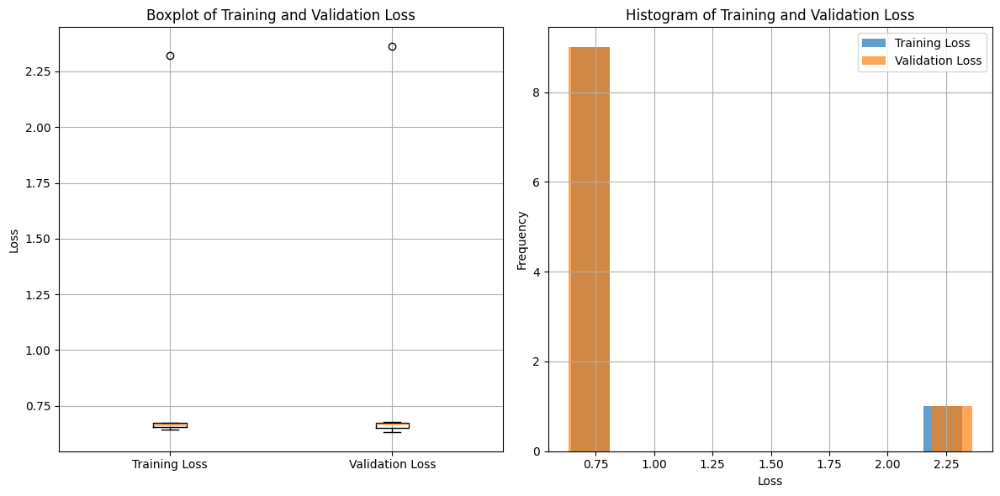

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'history' contains the training history from model.fit()
# For example: history = model.fit(train_data, validation_data=val_data, epochs=10)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_images, train_manuals, epochs=10, batch_size=32, validation_data=(test_images, test_manuals))
# Extract training and validation loss from history
training_loss = history.history['loss']
validation_loss = history.history['val_loss']

# Plot Boxplot for Training and Validation Loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.boxplot([training_loss, validation_loss], labels=['Training Loss', 'Validation Loss'])
plt.title('Boxplot of Training and Validation Loss')
plt.ylabel('Loss')
plt.grid(True)

# Plot Histogram for Training and Validation Loss
plt.subplot(1, 2, 2)
plt.hist(training_loss, bins=10, alpha=0.7, label='Training Loss')
plt.hist(validation_loss, bins=10, alpha=0.7, label='Validation Loss')
plt.title('Histogram of Training and Validation Loss')
plt.xlabel('Loss')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

FGSM ATTACK BY INCREASING THE VALUE OF EPSILON


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - accuracy: 0.9737 - loss: 1.2694
Adversarial Test Loss: 1.269395112991333
Adversarial Test Accuracy: 0.9737434387207031
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


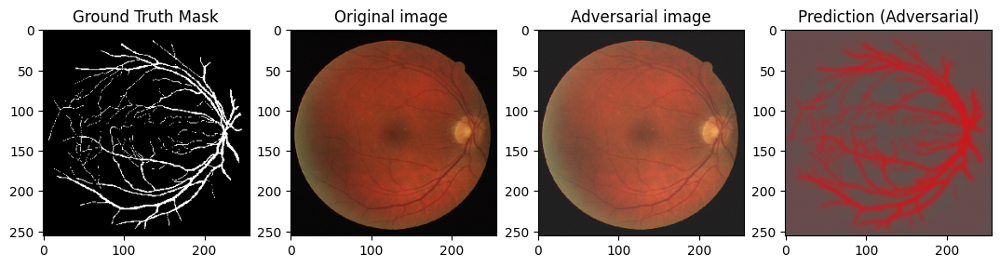

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


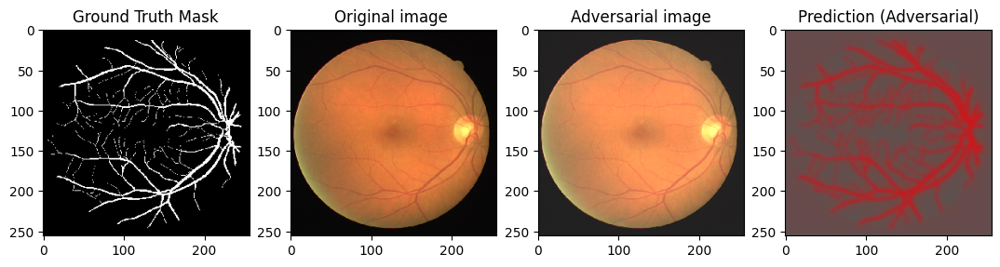

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


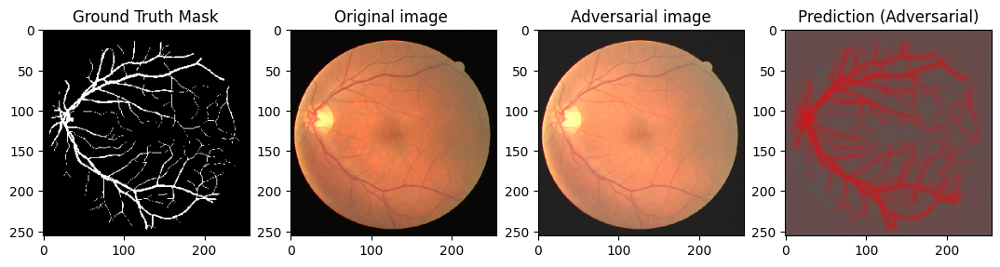

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


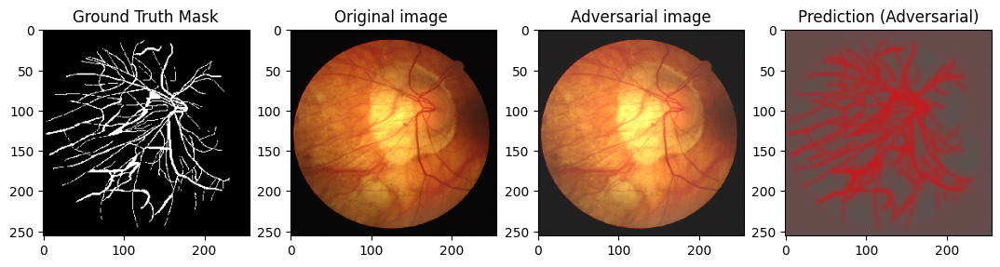

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model  # Import load_model
from sklearn.model_selection import train_test_split # Import train_test_split
import os # Import the os module
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator # Import necessary functions

# Define folders for images and labels
image_folder = '/content/drive/MyDrive/drive/drive/train/1st_manual'
manual_folder = '/content/drive/MyDrive/drive/drive/train/images'

# Function to load and preprocess images
def load_and_preprocess_images(image_folder, size=(256, 256)):
    image_list = []
    filenames = sorted(os.listdir(image_folder))  # Ensure matching order
    for filename in filenames:
        img_path = os.path.join(image_folder, filename)
        img = load_img(img_path, target_size=size)
        img_array = img_to_array(img) / 255.0  # Normalize images to [0, 1]
        image_list.append(img_array)
    return np.array(image_list), filenames

# Load images and manuals
images, _ = load_and_preprocess_images(image_folder)
manuals, _ = load_and_preprocess_images(manual_folder)

# Check if the number of samples in 'images' and 'manuals' match
if images.shape[0] != manuals.shape[0]:
    raise ValueError("The number of images and manuals does not match.")

# Load the trained model
model = load_model('/content/drive/MyDrive/UNET_Model.h5')

# Split data into training and testing sets
train_images, test_images, train_manuals, test_manuals = train_test_split(
    images, manuals, test_size=0.25, random_state=42
)

# FGSM attack function to create perturbation based on ground truth mask
def create_adversarial_pattern(input_image, input_label, model):
    with tf.GradientTape() as tape:
        tape.watch(input_image)
        prediction = model(input_image)
        loss = tf.keras.losses.categorical_crossentropy(input_label, prediction)

    # Get the gradients of the loss w.r.t to the input image.
    gradient = tape.gradient(loss, input_image)

    # Get the sign of the gradients to create the perturbation
    signed_grad = tf.sign(gradient)
    return signed_grad

# Generate adversarial images and masks based on ground truth
def generate_adversarial_images_and_masks(model, images, labels, epsilon=0.01):
    adversarial_images = []
    adversarial_labels = []
    for image, label in zip(images, labels):
        # Convert image and label to tensors
        image_tensor = tf.convert_to_tensor(image.reshape((1, *image.shape)), dtype=tf.float32)
        label_tensor = tf.convert_to_tensor(label.reshape((1, *label.shape)), dtype=tf.float32)

        # Generate adversarial image based on ground truth
        perturbation = create_adversarial_pattern(image_tensor, label_tensor, model)
        adversarial_image = image_tensor + epsilon * perturbation
        adversarial_image = tf.clip_by_value(adversarial_image, 0, 1)  # Ensure values are in [0, 1]
        adversarial_images.append(adversarial_image.numpy().squeeze())

        # Generate adversarial mask based on adversarial ground truth
        perturbation_label = create_adversarial_pattern(label_tensor, label_tensor, model)
        adversarial_label = label_tensor + epsilon * perturbation_label
        adversarial_label = tf.clip_by_value(adversarial_label, 0, 1)
        adversarial_labels.append(adversarial_label.numpy().squeeze())

    return np.array(adversarial_images), np.array(adversarial_labels)

# Set epsilon for adversarial perturbation
epsilon = 0.1

# Generate adversarial test images and masks
adversarial_test_images, adversarial_test_labels = generate_adversarial_images_and_masks(
    model, test_images, test_manuals, epsilon=epsilon
)

# Evaluate the model on the adversarial examples
adv_test_loss, adv_test_accuracy = model.evaluate(adversarial_test_images, adversarial_test_labels)
print(f"Adversarial Test Loss: {adv_test_loss}")
print(f"Adversarial Test Accuracy: {adv_test_accuracy}")

# Display sample adversarial predictions
def display_adversarial_prediction(index):
    plt.figure(figsize=(20, 8))

    # ground truth mask
    plt.subplot(1, 6, 1)
    plt.title("Ground Truth Mask")
    plt.imshow(test_images[index])

    # original image
    plt.subplot(1, 6, 2)
    plt.title("Original image ")
    plt.imshow(test_manuals[index])



    #adversial image
    plt.subplot(1, 6, 3)
    plt.title("Adversarial image")
    plt.imshow(adversarial_test_labels[index])

    # Model Prediction for Adversarial Image
    adv_pred = model.predict(adversarial_test_images[index:index + 1])[0]
    plt.subplot(1, 6, 4)
    plt.title("Prediction (Adversarial)")
    plt.imshow(adv_pred,cmap="gray")

    plt.show()

# Display adversarial predictions for a few test samples
num_samples = min(5, len(test_images))  # Limit to available samples
for i in range(num_samples):
    display_adversarial_prediction(i)
